In [1]:
import tensorflow as tf
import keras

In [2]:
(x_train, y_train), (x_test, y_test) = keras.datasets.fashion_mnist.load_data()

29515/29515 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
26421880/26421880 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
5148/5148 ━━━━━━━━━━━━━━━━━━━━ 0s 1us/step
4422102/4422102 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [3]:
print(f"x_train shape: {x_train.shape}")
print(f"x_test shape: {x_test.shape}")

x_train shape: (60000, 28, 28)
x_test shape: (10000, 28, 28)


In [4]:
print(y_train[:10])
print(y_test[:10])

[9 0 0 3 0 2 7 2 5 5]
[9 2 1 1 6 1 4 6 5 7]


In [5]:
import matplotlib.pyplot as plt

def visualize_data(image, class_name):
  plt.figure(figsize = (1,1))
  plt.imshow(image, cmap = "gray")
  plt.xlabel(class_name)
  plt.show()

In [6]:
class_names = ["T-shirt/top", "Trouser", "Pullover", "Dress", "Coat", "Sandal", "Shirt", "Sneaker", "Bag", "Ankle boot"]

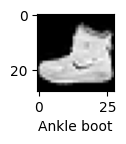

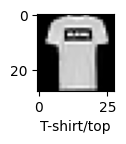

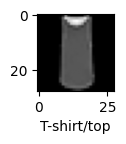

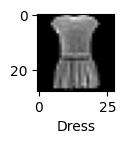

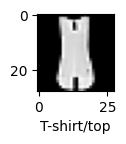

In [7]:
for i in range(5):
  image = x_train[i]
  class_name = class_names[y_train[i]]
  visualize_data(image, class_name)

In [9]:
conv_layer = keras.layers.Conv2D(
    filters = 32,
    kernel_size = 5,
    strides = 1,
    padding = "same",
    activation = "relu",
)

In [10]:
x = tf.random.normal([2, 64, 48, 3])

In [11]:
y = conv_layer(x)

In [12]:
conv_layer.weights

[<KerasVariable shape=(5, 5, 3, 32), dtype=float32, path=conv2d/kernel>,
 <KerasVariable shape=(32,), dtype=float32, path=conv2d/bias>]

In [13]:
y.shape

TensorShape([2, 64, 48, 32])

In [14]:
max_pooling_layer = keras.layers.MaxPool2D(
    pool_size = 2,
    strides = None,
    padding = "valid",
)

In [15]:
avg_pooling_layer = keras.layers.AveragePooling2D(
    pool_size = 2,
    strides = None,
    padding = "valid",
)

In [16]:
y = max_pooling_layer(x)

In [17]:
print(f"x shape: {x.shape}")
print(f"y shape: {y.shape}")

x shape: (2, 64, 48, 3)
y shape: (2, 32, 24, 3)


In [18]:
flatten_layer = keras.layers.Flatten()

In [19]:
y = flatten_layer(x)

In [20]:
print(f"x shape: {x.shape}")
print(f"y shape: {y.shape}")

x shape: (2, 64, 48, 3)
y shape: (2, 9216)


In [21]:
cnn_model = keras.models.Sequential(
    [
        keras.Input(shape = (28, 28, 1)),
        keras.layers.Conv2D(32, 3, activation = "relu",),
        keras.layers.MaxPool2D(),
        keras.layers.Conv2D(64, 3, activation = "relu"),
        keras.layers.Flatten(),
        keras.layers.Dense(64, activation = "relu"),
        keras.layers.Dense(10, activation = "softmax"),
    ]
)

In [22]:
cnn_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_1 (Conv2D)                    │ (None, 26, 26, 32)          │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 13, 13, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 11, 11, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 7744)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │         495,680 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 10)                  │             650 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 515,146 (1.97 MB)

 Trainable params: 515,146 (1.97 MB)

 Non-trainable params: 0 (0.00 B)

### 이미지 데이터 증강 예시

In [23]:
import glob
import matplotlib.pyplot as plt

def show_images(original_image, augmented_image):
  fig, ax = plt.subplots(1, 2, figsize = (10, 5))

  ax[0].imshow(original_image)
  ax[0].set_title("Original Image")
  ax[0].axis("off")

  ax[1].imshow(augmented_image)
  ax[1].set_title("Augmented Image")
  ax[1].axis("off")

  plt.tight_layout()
  plt.show()

def parse_image(file_path):
  image = tf.io.read_file(file_path)
  image = tf.io.decode_jpeg(image)
  image = image / 255
  return image

image_root = keras.utils.get_file(
    "flower_photos",
    "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz",
    untar = True,
)

image_files = glob.glob(f"{image_root}/*/*.jpg")
filepath_dataset = tf.data.Dataset.from_tensor_slices(image_files).take(5)
image_dataset = filepath_dataset.map(parse_image).batch(1)

228813984/228813984 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [24]:
aug_layer = keras.layers.RandomFlip()

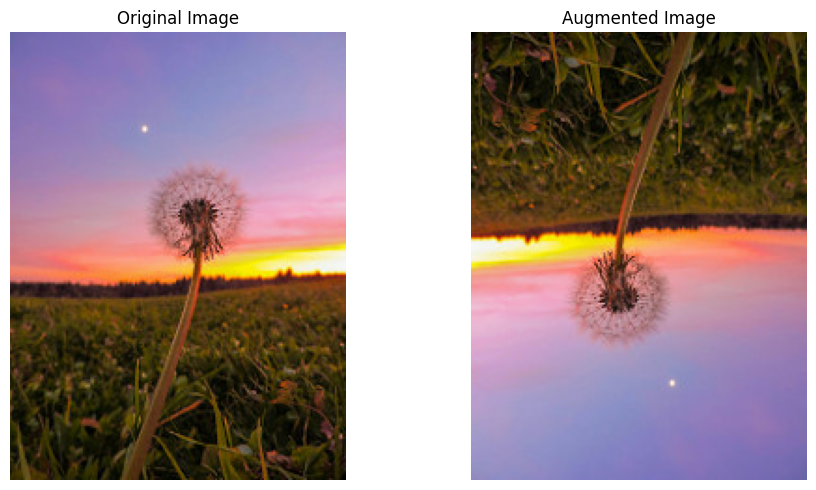

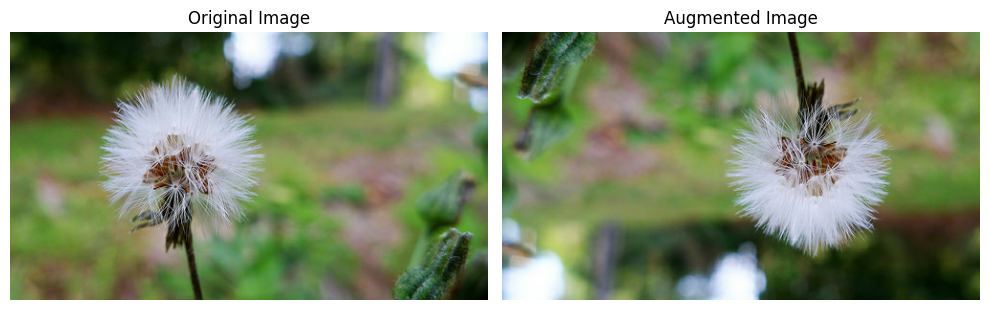

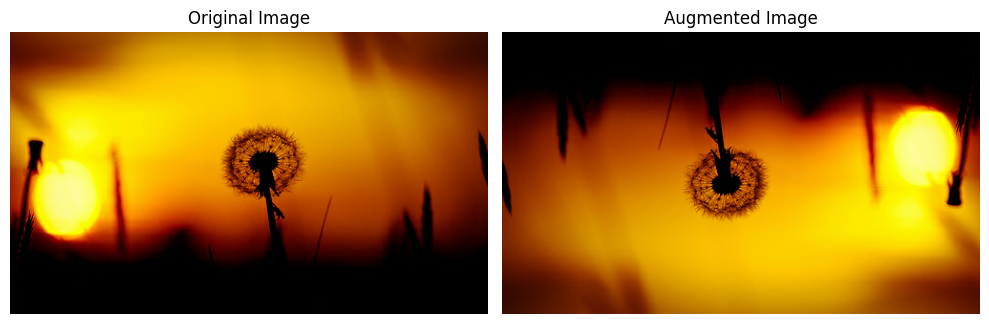

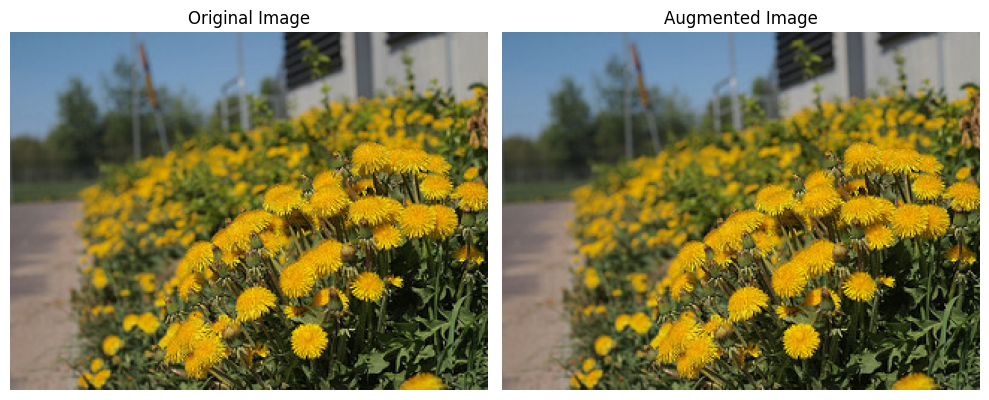

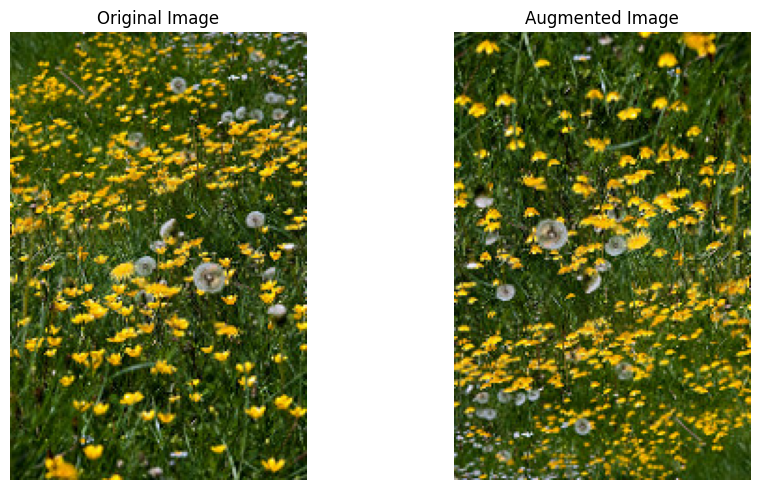

In [25]:
for image in image_dataset:
  aug_image = aug_layer(image)
  show_images(image[0], aug_image[0])

In [28]:
aug_layer = keras.layers.RandomTranslation(
    height_factor = (-0.3, 0.1),
    width_factor = 0.2,
    fill_mode = "constant", # "constant", "wrap", "nearest"
)

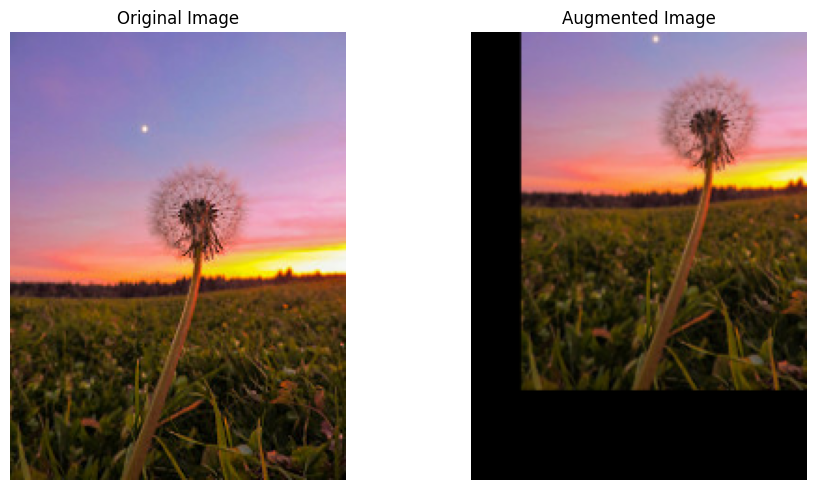

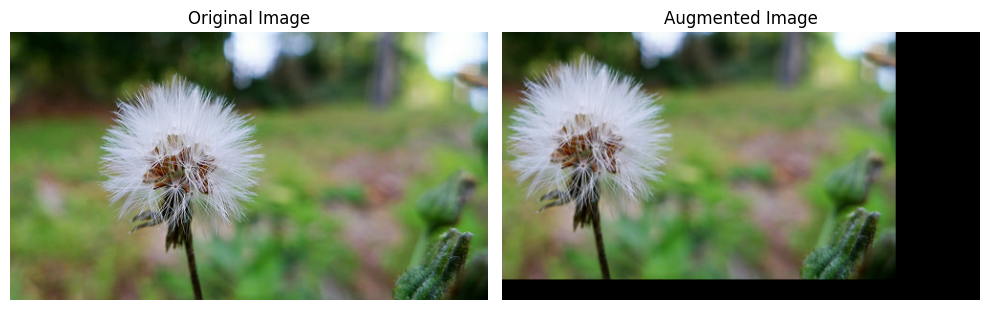

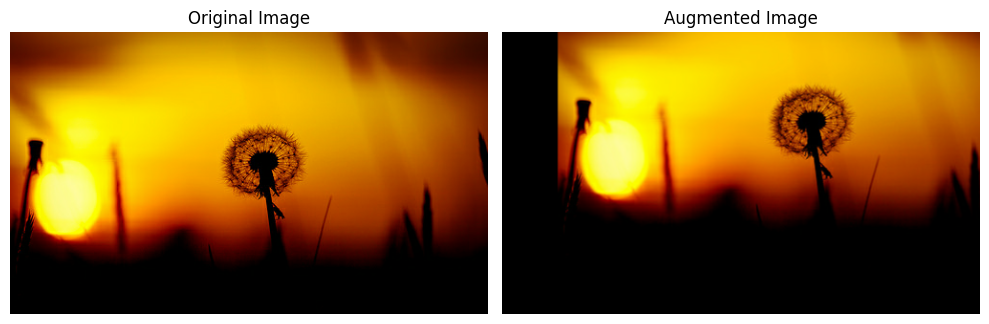

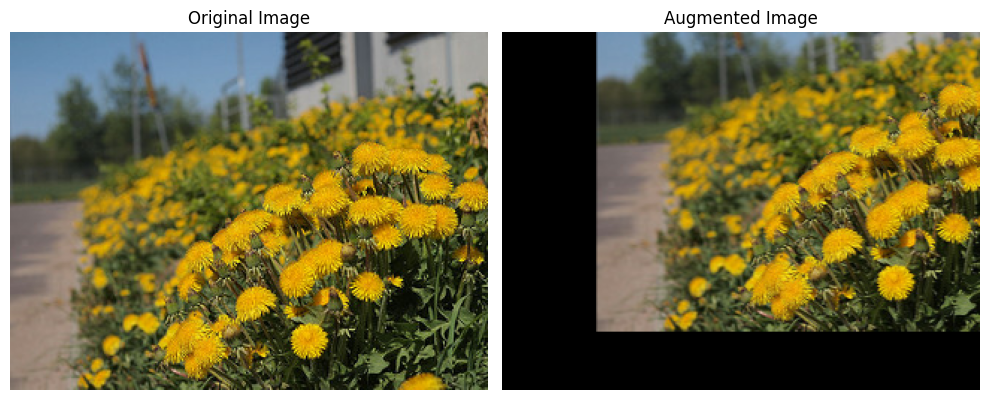

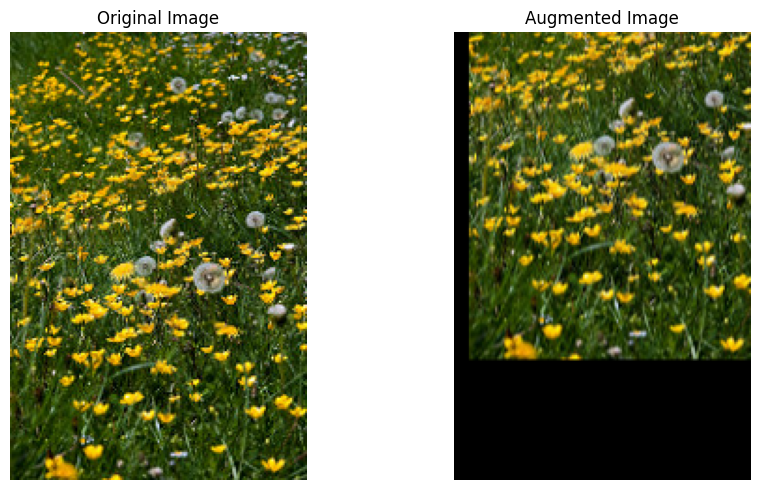

In [29]:
for image in image_dataset:
  aug_image = aug_layer(image)
  show_images(image[0], aug_image[0])

In [31]:
aug_layer = keras.layers.RandomRotation(
    factor = (-0.5, 0.1),
    fill_mode = "constant",
)

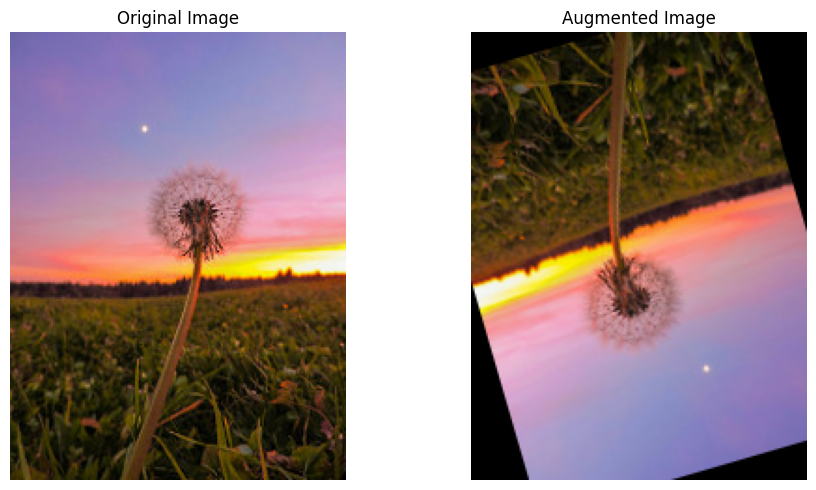

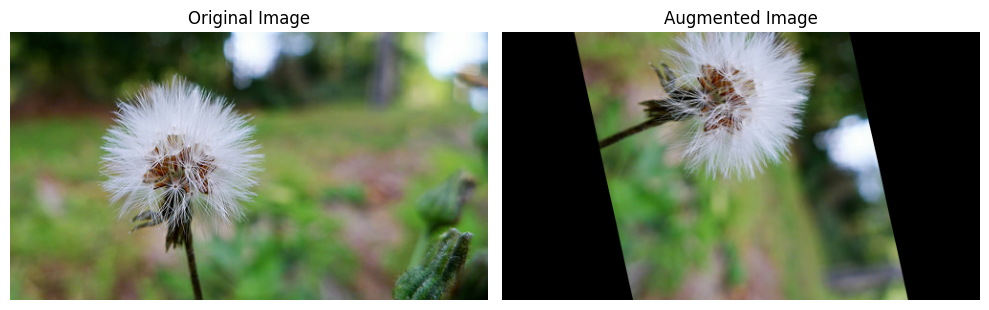

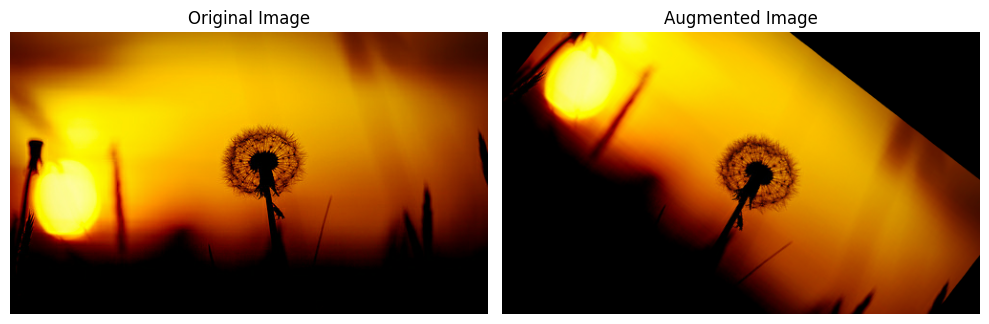

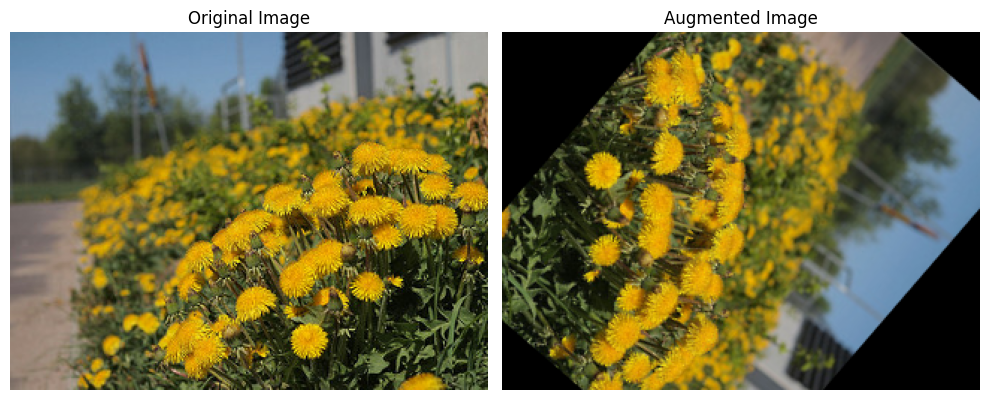

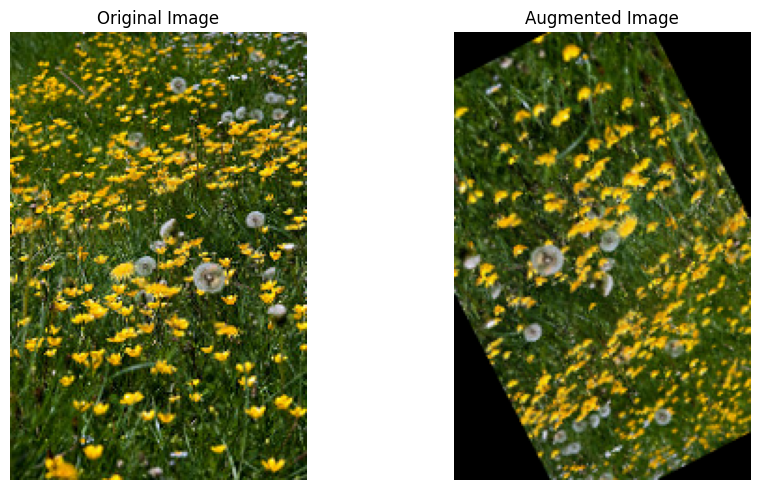

In [32]:
for image in image_dataset:
  aug_image = aug_layer(image)
  show_images(image[0], aug_image[0])

In [34]:
aug_layer = keras.layers.RandomBrightness(0.3, value_range = (0,1))

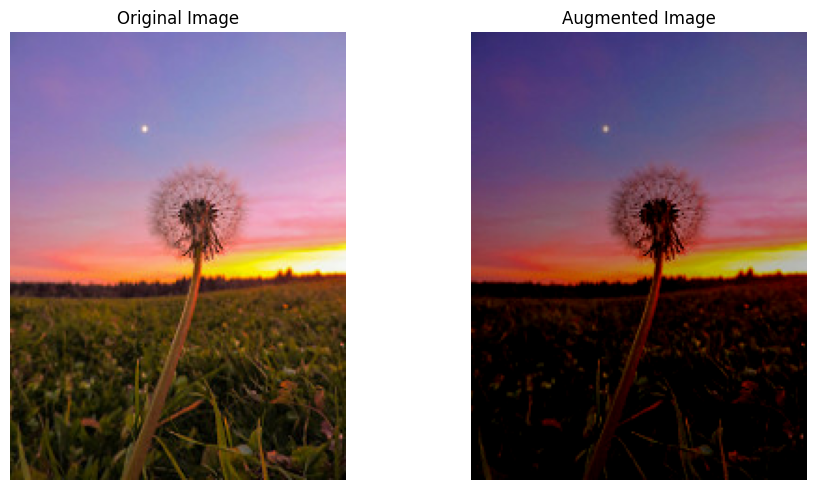

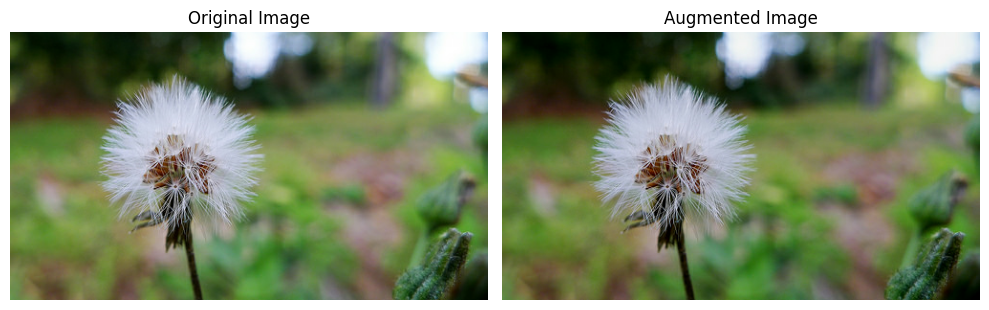

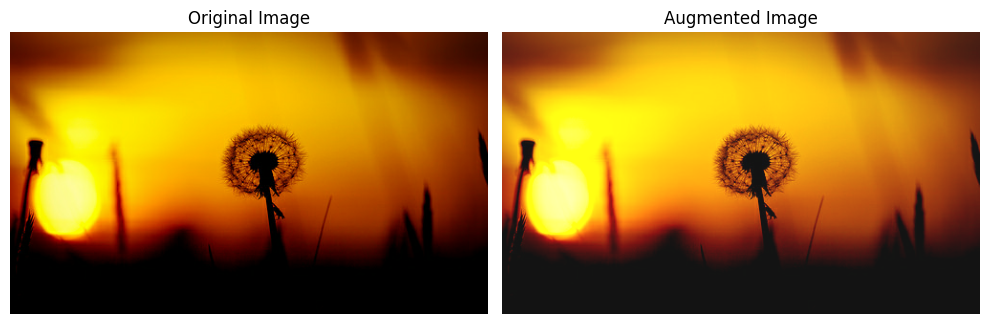

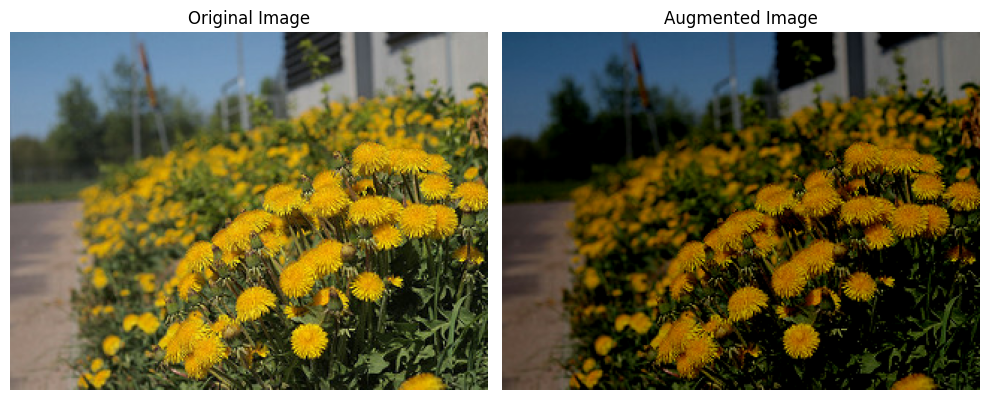

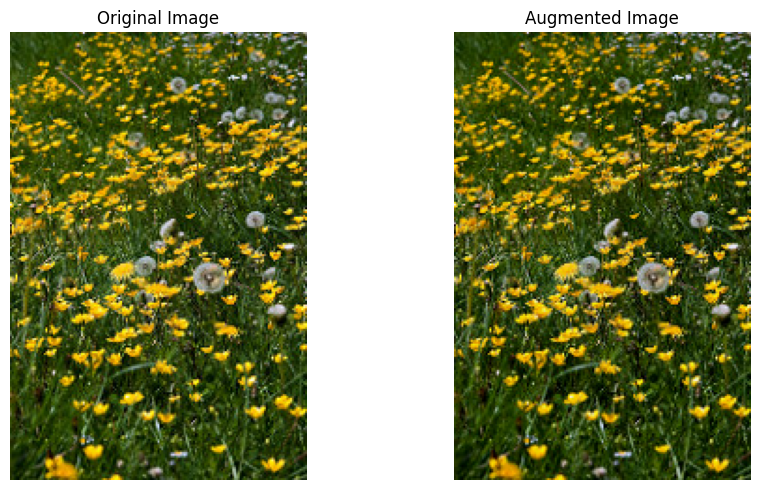

In [36]:
for image in image_dataset:
  aug_image = aug_layer(image, training = True)
  show_images(image[0], aug_image[0])

In [38]:
cnn_model = keras.models.Sequential(
    [
        keras.Input(shape = (28, 28, 1)),
        keras.layers.RandomFlip("horizontal"),
        keras.layers.RandomRotation(0.1),
        keras.layers.Conv2D(32, 3, activation = "relu",),
        keras.layers.MaxPool2D(),
        keras.layers.Conv2D(64, 3, activation = "relu"),
        keras.layers.Flatten(),
        keras.layers.Dense(64, activation = "relu"),
        keras.layers.Dense(10, activation = "softmax"),
    ]
)

In [39]:
x = tf.random.normal([2, 28, 28, 1])

In [40]:
y1 = cnn_model(x, training = True)
y2 = cnn_model(x, training = False)

### 이미지 분류 모델 학습

In [41]:
(x_train, y_train), (x_test, y_test) = keras.datasets.fashion_mnist.load_data()

num_val_data = 10000
x_val, y_val = x_train[-num_val_data:], y_train[-num_val_data:]
x_train, y_train = x_train[:-num_val_data], y_train[:-num_val_data]

train_dataset = tf.data.Dataset.from_tensor_slices((x_train, y_train)).shuffle(128).batch(32, drop_remainder = True)
val_dataset = tf.data.Dataset.from_tensor_slices((x_val, y_val)).batch(32)
test_dataset = tf.data.Dataset.from_tensor_slices((x_test, y_test)).batch(32)

In [42]:
model = keras.models.Sequential(
    [
        keras.Input(shape = (28, 28, 1)),
        keras.layers.RandomFlip("horizontal"),
        keras.layers.RandomRotation(0.1),
        keras.layers.Conv2D(32, 3, activation = "relu",),
        keras.layers.MaxPool2D(),
        keras.layers.Conv2D(64, 3, activation = "relu"),
        keras.layers.Flatten(),
        keras.layers.Dense(64, activation = "relu"),
        keras.layers.Dense(10, activation = "softmax"),
    ]
)

In [43]:
loss_fn = keras.losses.SparseCategoricalCrossentropy()
optimizer = keras.optimizers.Adam()
metric = keras.metrics.SparseCategoricalAccuracy()

In [44]:
model.compile(
    optimizer = optimizer,
    loss = loss_fn,
    metrics = [metric],
)

In [45]:
model.fit(
    x = train_dataset,
    epochs = 10,
    validation_data = val_dataset,
)

Epoch 1/10
1562/1562 ━━━━━━━━━━━━━━━━━━━━ 76s 48ms/step - loss: 1.7314 - sparse_categorical_accuracy: 0.6957 - val_loss: 0.5574 - val_sparse_categorical_accuracy: 0.7991
Epoch 2/10
1562/1562 ━━━━━━━━━━━━━━━━━━━━ 69s 44ms/step - loss: 0.5062 - sparse_categorical_accuracy: 0.8161 - val_loss: 0.4876 - val_sparse_categorical_accuracy: 0.8214
Epoch 3/10
1562/1562 ━━━━━━━━━━━━━━━━━━━━ 99s 55ms/step - loss: 0.4493 - sparse_categorical_accuracy: 0.8369 - val_loss: 0.4938 - val_sparse_categorical_accuracy: 0.8202
Epoch 4/10
1562/1562 ━━━━━━━━━━━━━━━━━━━━ 142s 56ms/step - loss: 0.4175 - sparse_categorical_accuracy: 0.8478 - val_loss: 0.4342 - val_sparse_categorical_accuracy: 0.8463
Epoch 5/10
1562/1562 ━━━━━━━━━━━━━━━━━━━━ 116s 39ms/step - loss: 0.3954 - sparse_categorical_accuracy: 0.8544 - val_loss: 0.4095 - val_sparse_categorical_accuracy: 0.8542
Epoch 6/10
1562/1562 ━━━━━━━━━━━━━━━━━━━━ 80s 38ms/step - loss: 0.3731 - sparse_categorical_accuracy: 0.8633 - val_loss: 0.4290 - val_sparse_categor

In [46]:
model.evaluate(test_dataset)

313/313 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.4115 - sparse_categorical_accuracy: 0.8683


[0.4228426218032837, 0.8657000064849854]

In [47]:
predictions = model.predict(test_dataset.take(1))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


In [48]:
predictions

array([[8.74517811e-14, 2.93439943e-23, 5.58164727e-18, 2.43375747e-18,
        2.43694961e-21, 3.05933609e-05, 2.63940527e-15, 2.25716780e-04,
        1.45212606e-08, 9.99743700e-01],
       [1.27509907e-06, 8.16941133e-12, 9.89638209e-01, 7.82791193e-11,
        9.29096621e-03, 2.02743435e-13, 1.06961979e-03, 7.75680268e-16,
        1.06479492e-08, 1.06706521e-13],
       [2.79838787e-06, 9.99996603e-01, 2.71649675e-10, 5.10515918e-07,
        8.58208526e-09, 9.69228257e-12, 1.93767296e-08, 3.10579638e-16,
        1.90494798e-09, 1.02126736e-11],
       [3.35458701e-08, 9.99999821e-01, 3.35301474e-11, 9.81272024e-08,
        1.67830390e-08, 8.95024309e-15, 3.62605079e-09, 1.01901041e-17,
        3.67784666e-12, 2.23077579e-14],
       [1.50711939e-01, 4.41181919e-06, 8.16649571e-02, 1.69535878e-03,
        3.07760201e-02, 4.17714352e-09, 7.34997630e-01, 1.48485807e-11,
        1.49625092e-04, 3.32014055e-10],
       [2.31291040e-07, 9.99999702e-01, 9.22196347e-11, 1.09403353e-09,
   

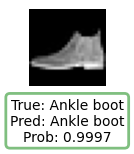

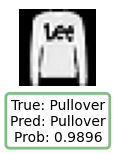

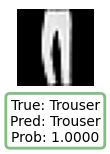

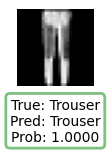

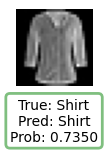

...

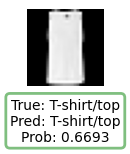

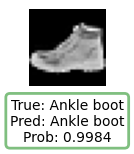

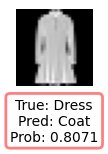

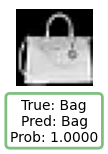

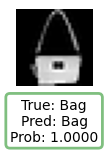

In [49]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_data(image, predicted_class, true_class, prob, correct):
  plt.figure(figsize = (1, 1))
  plt.imshow(image, cmap = "gray")
  plt.axis("off")

  edge_color = "green" if correct else "red"

  plt.text(
      0.5, -0.15,
      f"True: {true_class}\nPred: {predicted_class}\nProb: {prob:.4f}",
      fontsize = 10, ha = "center", va = "top", transform = plt.gca().transAxes,
      bbox = dict(facecolor = "white", alpha = 0.5, edgecolor = edge_color, boxstyle = "round,pad = 0.3", linewidth = 2),
  )
  plt.show()

predicted_classes = np.argmax(predictions, axis = 1)
class_names = ["T-shirt/top", "Trouser", "Pullover", "Dress", "Coat", "Sandal", "Shirt", "Sneaker", "Bag", "Ankle boot"]

for i, predicted_class in enumerate(predicted_classes):
  true_class = class_names[y_test[i]]
  predicted_class_name = class_names[predicted_class]
  correct = (predicted_class == y_test[i])

  visualize_data(
      x_test[i],
      predicted_class_name,
      true_class,
      predictions[i][predicted_class],
      correct,

  )
